<a href="https://colab.research.google.com/github/jamesBaker361/colab/blob/master/transfertwo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# pytorch imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms.functional as tF
import torchvision.models as models

# visualization tools
from PIL import Image,ImageOps
import matplotlib.pyplot as plt
plt.ion()

# misc
import numpy as np
import os
import copy
from urllib.request import urlretrieve
from google.colab import files

In [0]:
# specify whether pytorch uses cpu or gpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# desired size of the output image
imsize = 800

In [0]:
# reads image from disk and casts it to a tensor
def imload(image_name, imsize,content=True):
    image = Image.open(image_name)        # read the image into an array
    if content==True:
      horiz=0
      vert=0
      if image.width < imsize or image.height <imsize:
        if image.height >image.width:
          horiz=int((image.height-image.width)/2)
        else:
          vert=int((image.width-image.height)/2)
      image=ImageOps.expand(image,border=(horiz,vert),fill="white")
    image = tF.resize(image, imsize)      # resize the image and casts it to a tensor
    image = tF.center_crop(image, imsize) # center crop to size
    image = tF.to_tensor(image)           # cast PIL image to pytorch tensor
    image = image.float()                 # cast to float tensor
    image = image.unsqueeze(0)            # insert dummy batch dimension needed to fit into the model
    
    return image
  
# unload a tensor into a PIL image
imunload = torchvision.transforms.ToPILImage()

# displays an image from a tensor
def imshow(tensor, title=None):
    image = tensor.cpu().clone() # clone the tensor to not do changes on it
    image = image.squeeze(0)     # remove the fake batch dimension
    image = imunload(image)      # unload the image into PIL
    
    # matplotlib: show the image
    plt.imshow(image)
    plt.grid(False)
    if title is not None:
        plt.title(title)
    plt.show()
    return

In [0]:
def urlsToTensors(urls,content=True):
  cont=[]
  for u in urls:
    print(u)
    _ = urlretrieve(u,'img.jpg')
    cont.append(imload("./img.jpg", imsize,content).to(device))
  return(cont)

In [0]:
# set loss weights
content_weight = 1
style_weight = 120000

# set number of steps
# 16 steps take around 60s
steps = 16

In [0]:
# get gram matrix of feature block
def gram_matrix(x):
    # flatten spatial features
    bs, nfeats, h, w = x.size()
    x = x.view(bs*nfeats, h*w)
    
    # compute gram product by matrix multiplication and normalize
    G = torch.mm(x, x.t())
    G.div(bs*nfeats*h*w)
    return G

In [0]:
# default vgg normalization values
vgg_norm_mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
vgg_norm_std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)

# extract features from input at layers of interest
class VGGFeatureExtractor(nn.Module):
    
    # given a vgg model, makes a copy of the vgg with only the
    # layers required to extract features at layers of interest;
    def __init__(self, vgg, layers_of_interest):
        super(VGGFeatureExtractor, self).__init__()
        
        # remember layers of interest
        self.layers_of_interest = layers_of_interest
        
        # copy vgg into a list
        # keep only up to the max layer of interest
        self.layer_list = []
        for i in range(max(layers_of_interest)+1):
            
            # replace relu layers with not in-place relu layers
            if isinstance(vgg[i], nn.ReLU):
                self.layer_list.append(nn.ReLU(inplace=False))
            
            # otherwise, just append a copy of the layer
            else:
                self.layer_list.append(copy.deepcopy(vgg[i]))
        
        # layer_list should now be just the subset of vgg
        # you need to extract features at layers of interest
        return
    
    # feed the input through the layers, remembering
    # the outputs of layers of interest
    def forward(self, x):
        
        # normalize the input
        x = (x - vgg_norm_mean.to(x.device)) / vgg_norm_std.to(x.device)
        
        # feed the input through layer by layer, while keeping
        # a list of features extracted at layers of interest
        extracted_features = {}
        for i in range(max(self.layers_of_interest)+1):
            
            # apply the layer to the previous output
            layer = self.layer_list[i]
            x = layer(x)
            
            # remember the output if the layer was of interest
            if i in self.layers_of_interest:
                extracted_features[i] = x
        
        # extracted_features should now have all features of interest
        return extracted_features

In [0]:
# get a copy of the pretrained vgg image classification model
vgg = models.vgg19(pretrained=True).features.to(device).eval()
#print(vgg)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.torch/models/vgg19-dcbb9e9d.pth
574673361it [00:09, 59103922.62it/s]


In [0]:
# we will select the following layers to use
content_layers = set([7])
style_layers = set([0,2,5,7,10])

In [0]:
# construct network, set it to evaluation mode
model = VGGFeatureExtractor(
    vgg,
    layers_of_interest=set.union(content_layers, style_layers),
).to(device).eval()

# vgg is no longer needed
del vgg

In [0]:
# get features for style image
# convert features into gram matrices
def styleImgToFeat(style_img): #style_img is a tensor of an image
  style_features = model(style_img)
  for i in style_features:
      style_features[i] = gram_matrix(style_features[i])
  style_features = {i:style_features[i].detach() for i in style_features}
  return style_features

In [0]:
def contImgToFeat(content_img): #also an image tensor
  content_features = model(content_img)
  content_features = {i:content_features[i].detach() for i in content_features}
  return content_features

In [0]:
def getx(content_img):
  x = content_img.clone()
  #imshow(x, title='x (input image)')
  # set x so that it takes gradient updates
  x.requires_grad_()
  optimizer = optim.LBFGS([x])
  return x,optimizer

In [0]:
def transfer(style_img,content_img):
  content_features=contImgToFeat(content_img)
  style_features=styleImgToFeat(style_img)
  x,optimizer=getx(content_img)
  # apply style for many steps
  for n in range(steps):

      # fancy gradient update procedure for lbfgs
      def closure():
          # clear gradients
          optimizer.zero_grad()

          # get features of x
          x_features = model(x)

          # calculate content loss
          content_loss = 0
          for i in content_layers:
              content_loss += F.mse_loss(
                  x_features[i],
                  content_features[i],
              )

          # calculate style loss
          style_loss = 0
          for i in style_layers:
              style_loss += F.mse_loss(
                  gram_matrix(x_features[i]),
                  style_features[i],
              )

          # calculate total loss, and backpropagate
          loss = content_loss*content_weight + style_loss*style_weight
          loss.backward(retain_graph=True)
          del x_features
          # return loss
          return loss
      optimizer.step(closure)

      # clamp image values
      x.data.clamp_(0,1)

      # print updates
      if n%4==0:
          print('step: %d / %d'%(n,steps))

  # print completion
  print('%d steps complete'%steps)
  #imshow(content_img, title='content image')
  #imshow(style_img, title='style image')
  imshow(x, title='style-transfered image')
  del content_img,content_features,style_img,style_features,optimizer
  return(x)

In [0]:
styleURLS=['https://images.graph.cool/v1/cj6c28vh912680101ozc2paxj/cjf2y07bi0xkc0140u26s5sh3/0x56:768x403/1200x630/picasso_lesfemmesdalger_low.jpg','https://static1.squarespace.com/static/581a9a15414fb5c2f5854382/t/590155521b10e3a01769545f/1493259602902/?format=500w','https://www.wallpaperup.com/uploads/wallpapers/2013/07/16/119081/836a833c76c301250d0b23c47a0248d8-700.jpg','https://www.wallpaperup.com/uploads/wallpapers/2013/01/02/27328/292982a76f9dc22c83a9e1e8cbce9dbb-700.jpg','https://www.wallpaperup.com/uploads/wallpapers/2013/04/05/70806/431c183d8edac38be3ffad9062e180d2-700.jpg']
contentURLS=['https://i.ytimg.com/vi/Wip3TEZjL-I/hqdefault.jpg','https://www.wallpaperup.com/uploads/wallpapers/2013/07/16/119081/836a833c76c301250d0b23c47a0248d8-700.jpg','https://images.homedepot-static.com/productImages/e7421b81-1e69-485f-bd27-3585924091d9/svn/alpine-garden-statues-wac406-64_1000.jpg','https://www.thesprucepets.com/thmb/ke9Aq-4i48fxoVSOS-hCDbXn9ug=/450x0/filters:no_upscale():max_bytes(150000):strip_icc()/GettyImages-136658283-58a6e91f5f9b58a3c918f385.jpg']

In [0]:
styles=urlsToTensors(styleURLS,False)
contents=urlsToTensors(contentURLS)


https://images.graph.cool/v1/cj6c28vh912680101ozc2paxj/cjf2y07bi0xkc0140u26s5sh3/0x56:768x403/1200x630/picasso_lesfemmesdalger_low.jpg
https://static1.squarespace.com/static/581a9a15414fb5c2f5854382/t/590155521b10e3a01769545f/1493259602902/?format=500w
https://www.wallpaperup.com/uploads/wallpapers/2013/07/16/119081/836a833c76c301250d0b23c47a0248d8-700.jpg
https://www.wallpaperup.com/uploads/wallpapers/2013/01/02/27328/292982a76f9dc22c83a9e1e8cbce9dbb-700.jpg
https://www.wallpaperup.com/uploads/wallpapers/2013/04/05/70806/431c183d8edac38be3ffad9062e180d2-700.jpg
https://i.ytimg.com/vi/Wip3TEZjL-I/hqdefault.jpg
https://www.wallpaperup.com/uploads/wallpapers/2013/07/16/119081/836a833c76c301250d0b23c47a0248d8-700.jpg
https://images.homedepot-static.com/productImages/e7421b81-1e69-485f-bd27-3585924091d9/svn/alpine-garden-statues-wac406-64_1000.jpg
https://www.thesprucepets.com/thmb/ke9Aq-4i48fxoVSOS-hCDbXn9ug=/450x0/filters:no_upscale():max_bytes(150000):strip_icc()/GettyImages-136658283-5

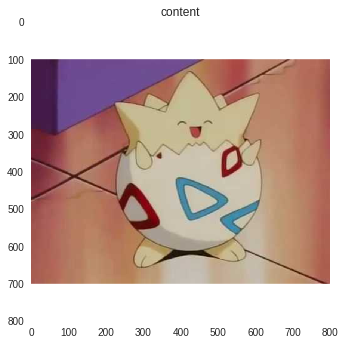

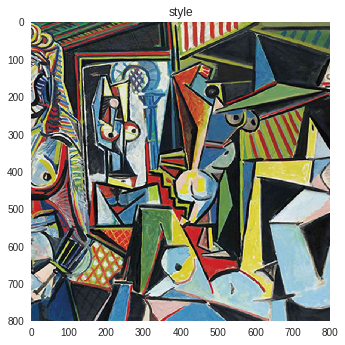

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


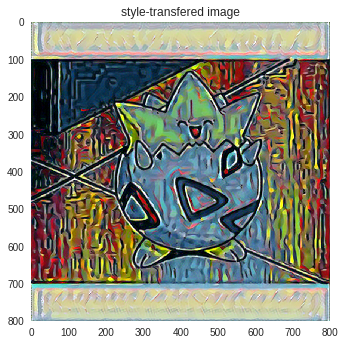

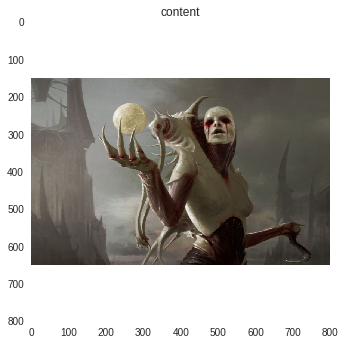

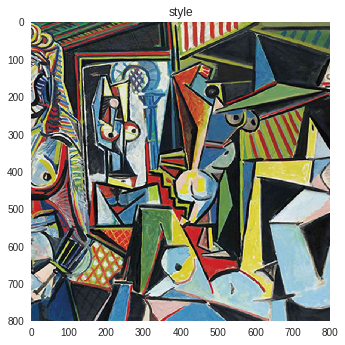

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


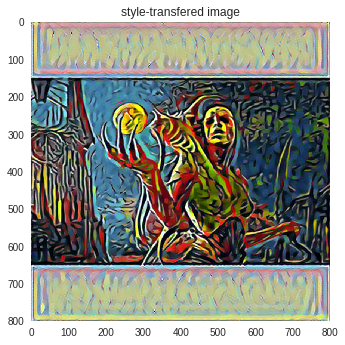

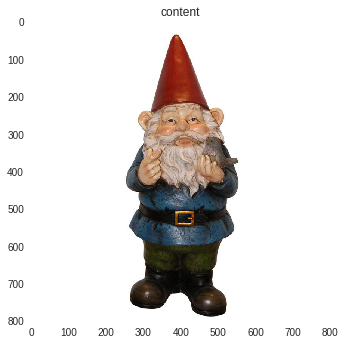

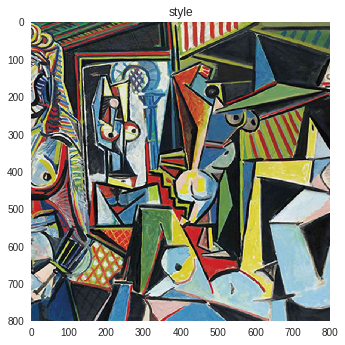

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


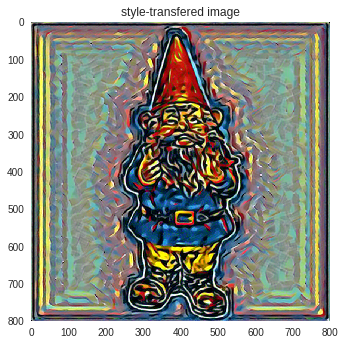

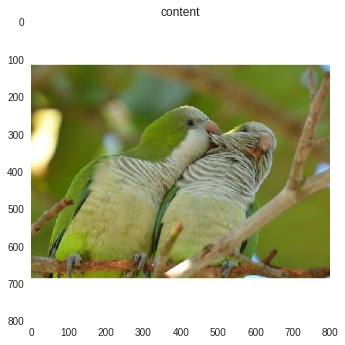

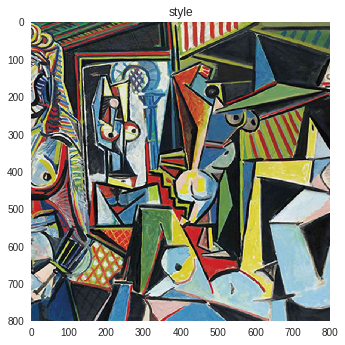

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


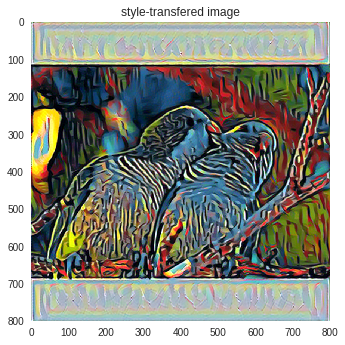

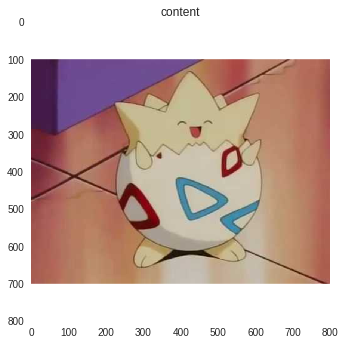

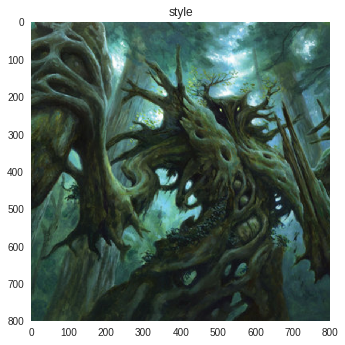

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


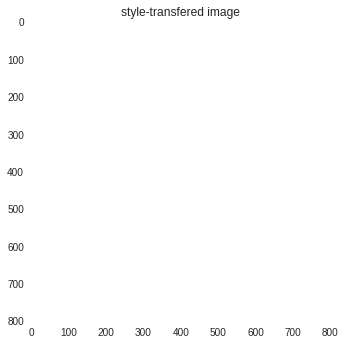

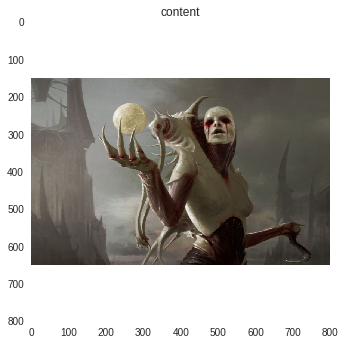

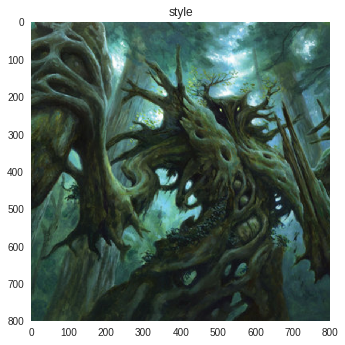

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


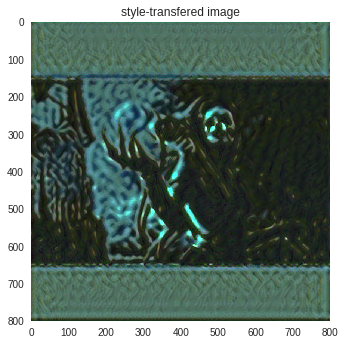

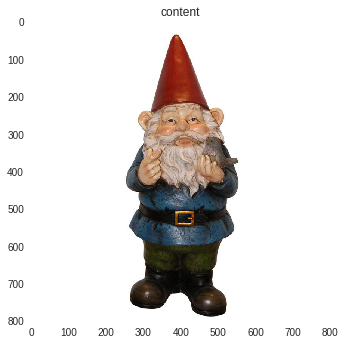

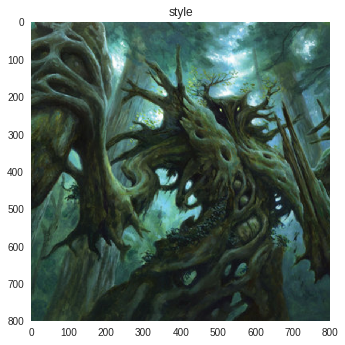

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


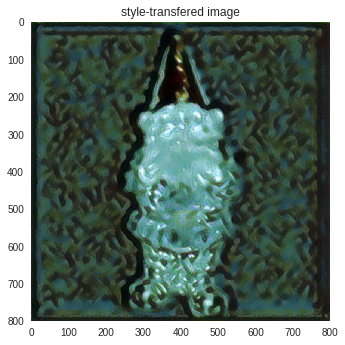

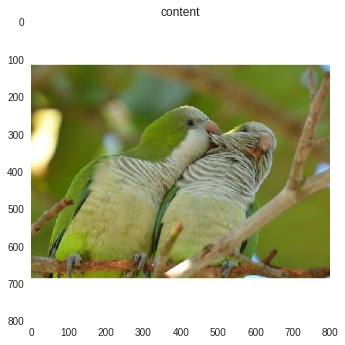

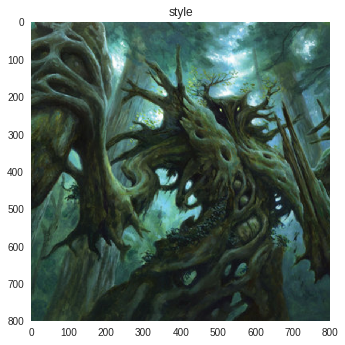

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


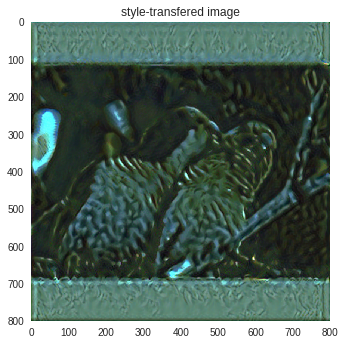

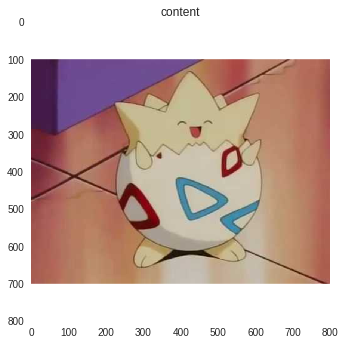

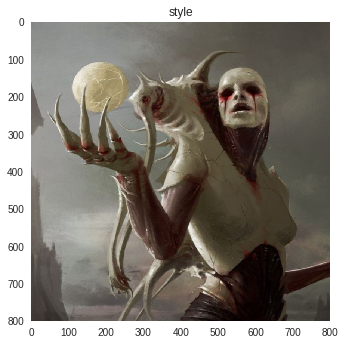

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


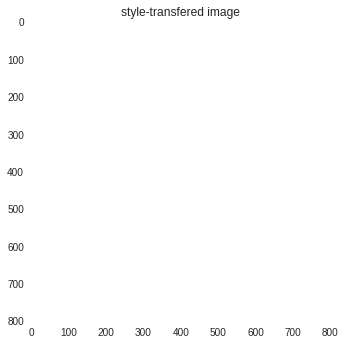

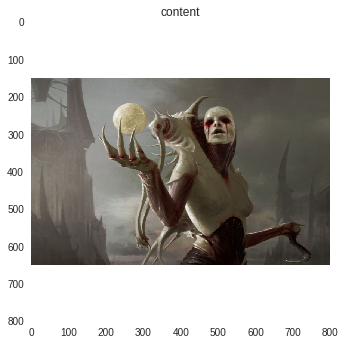

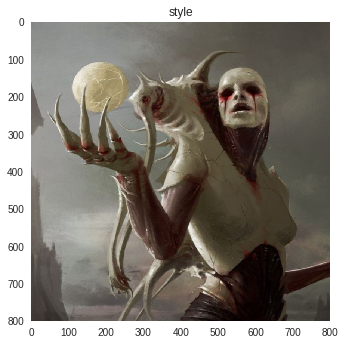

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


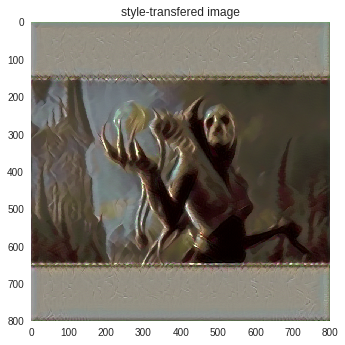

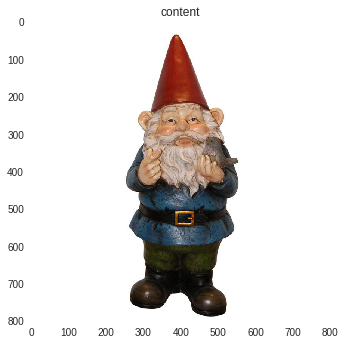

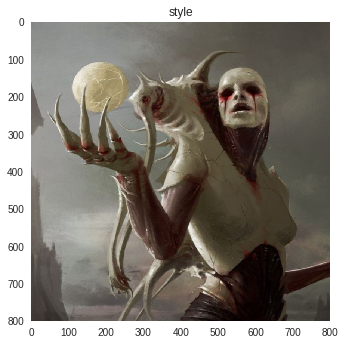

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


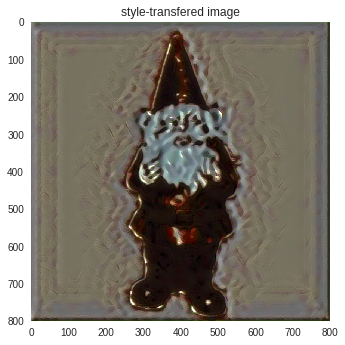

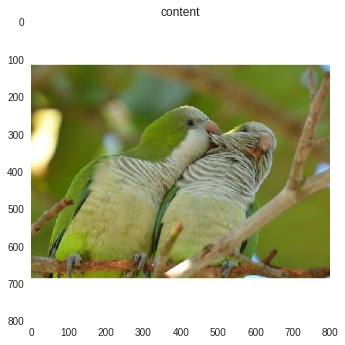

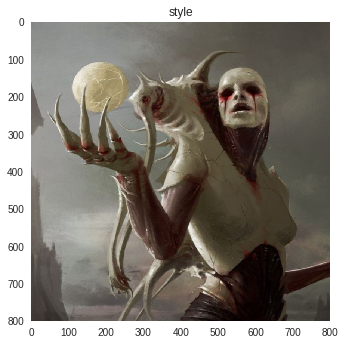

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


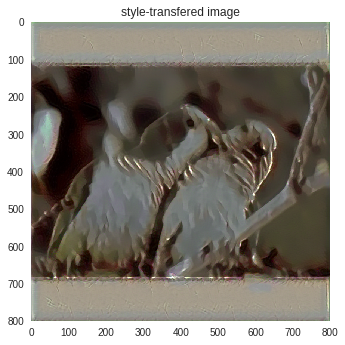

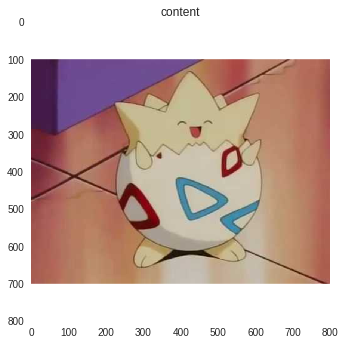

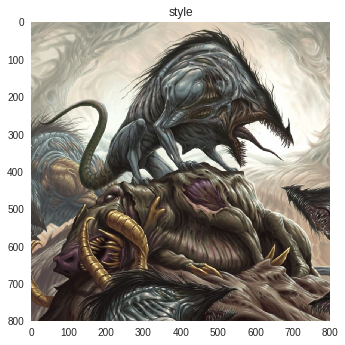

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


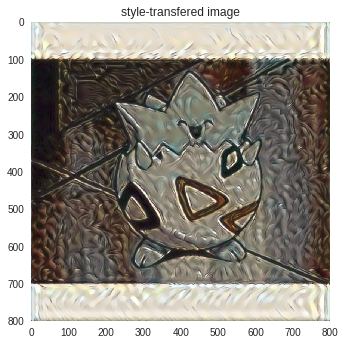

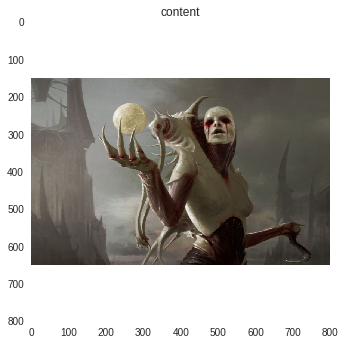

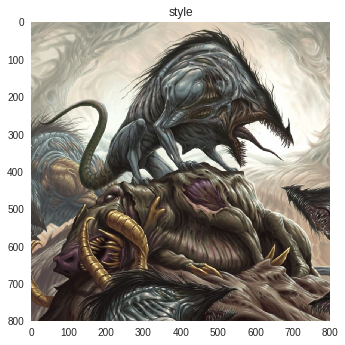

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


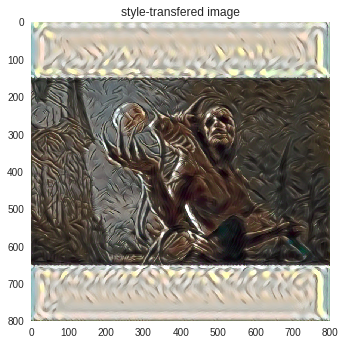

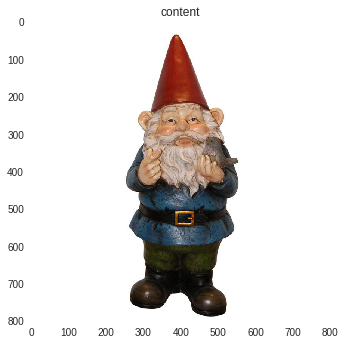

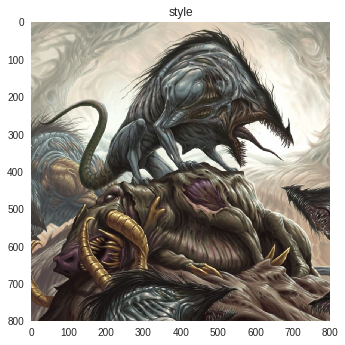

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


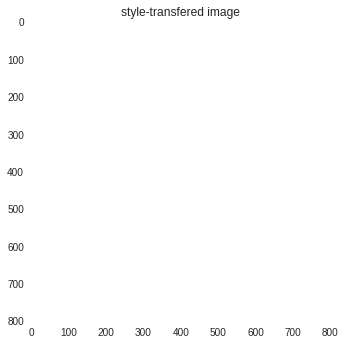

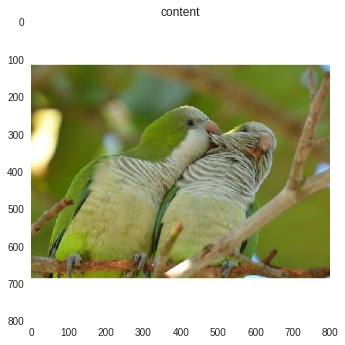

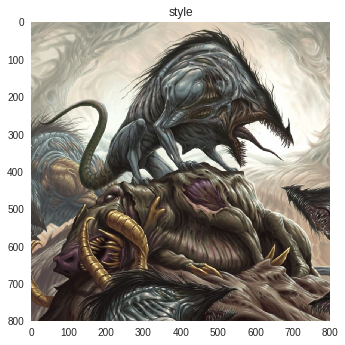

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


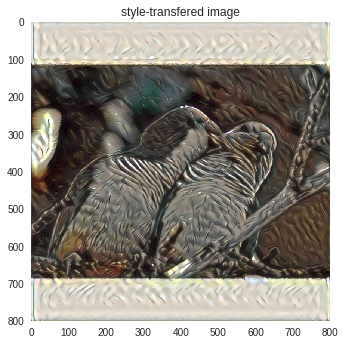

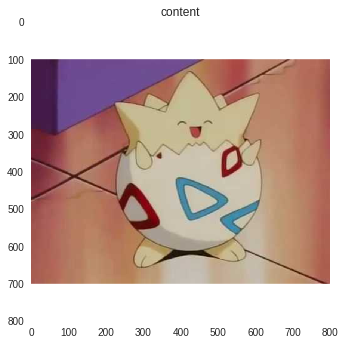

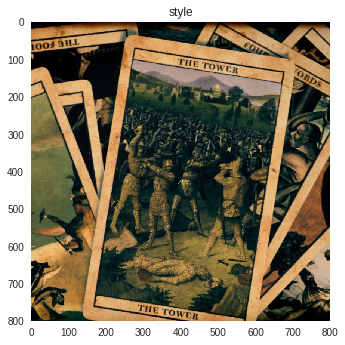

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


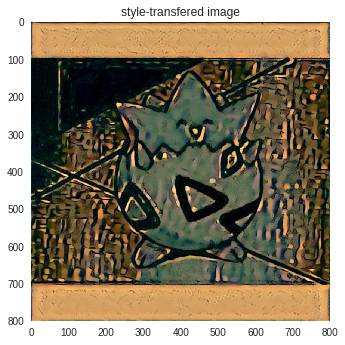

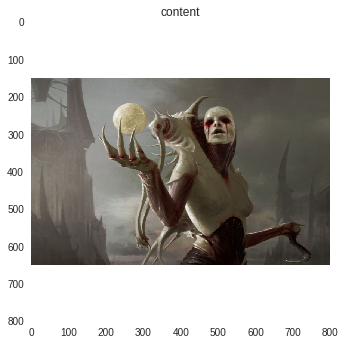

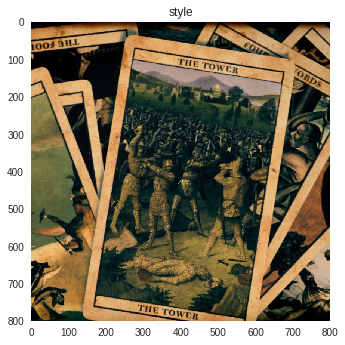

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


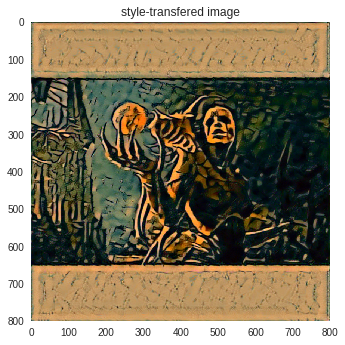

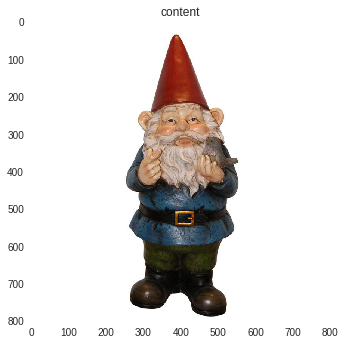

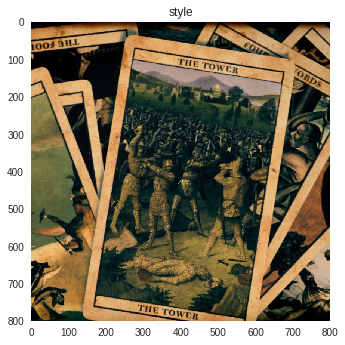

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


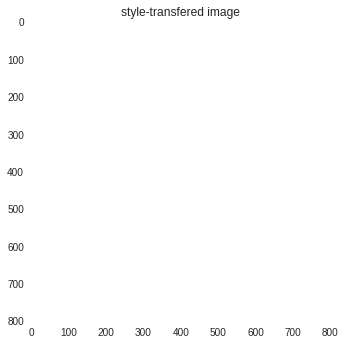

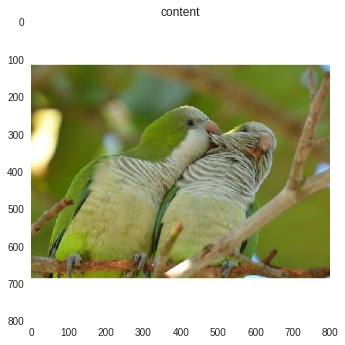

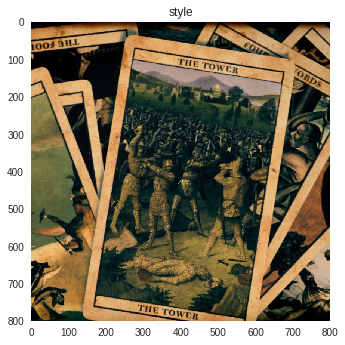

step: 0 / 16
step: 4 / 16
step: 8 / 16
step: 12 / 16
16 steps complete


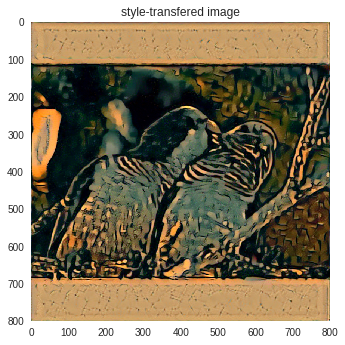

In [0]:
for s in styles:
  for c in contents:
    imshow(c,title="content")
    imshow(s,title="style")
    x=transfer(s,c)